# Plot Ensemble-Averaging pMDI Spray Images

This program reads output of Step4 and plots it.

    @author Daniel Duke <daniel.duke@monash.edu>
    @copyright (c) 2024 D.Duke
    @license GPL-3.0+
    @version 0.0.1
    @date 10/11/2025
    
    Multiphase Flow Laboratory
    Monash University, Australia


In [1]:
import h5py, os
import numpy as np

import matplotlib.pyplot as plt
%matplotlib widget

In [2]:
prefix='/Volumes/DUKE SSD ext4 2/2025_Oct_ConeAnglePlaceboStudy/90 & 120 degree/'

#case='20kHz_896x920_134a_0.3Or08L_cone901.3Dep_MK6'
#case='20kHz_896x920_134a_0.3Or08L_cone1201.3Dep_MK6'
case='20kHz_896x920_152_0.3Or08L_cone901.3Dep_MK6'

In [3]:
filename=prefix+case+'/reduced_output.h5'
H= h5py.File(filename, 'r')
ensemble_mean = H['ensemble statistics/ensemble mean']
temporal_std = H['ensemble statistics/temporal std']
repeatability = H['ensemble statistics/ensemble std']

In [7]:
def max95(x): return np.nanmean(x)+2*np.nanstd(x)

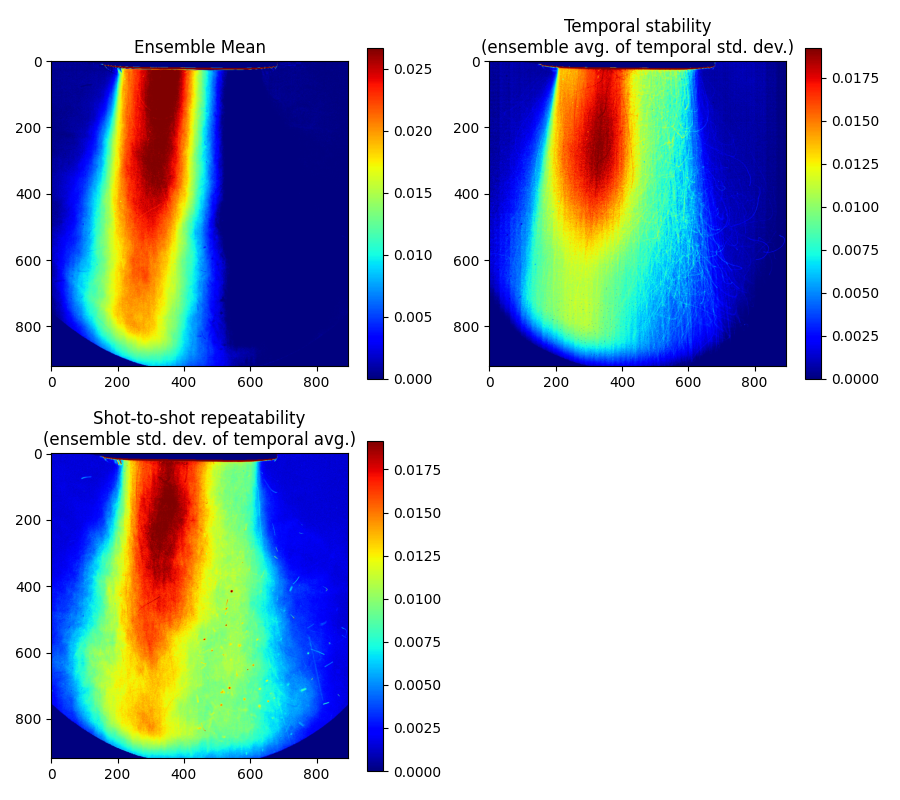

In [9]:
# Plot final statistics
fig=plt.figure(figsize=(9,8))
ax=fig.add_subplot(221)
meanmax=max95(ensemble_mean)
p=ax.imshow(ensemble_mean,cmap='jet',vmin=0,vmax=meanmax)
plt.colorbar(p)
plt.title("Ensemble Mean");

ax=fig.add_subplot(222)
corner=temporal_std[0:10,0:10]
temporal_std_baseline = temporal_std - np.nanmean(corner)
temporalstdmax=max95(temporal_std_baseline)
p=ax.imshow(temporal_std_baseline,cmap='jet',vmin=0,vmax=temporalstdmax)
plt.colorbar(p)
plt.title("Temporal stability\n(ensemble avg. of temporal std. dev.)");

ax=fig.add_subplot(223)
rptmax=max95(repeatability)
p=ax.imshow(repeatability,cmap='jet',vmin=0,vmax=rptmax)
plt.colorbar(p)
plt.title("Shot-to-shot repeatability\n(ensemble std. dev. of temporal avg.)");

plt.tight_layout();

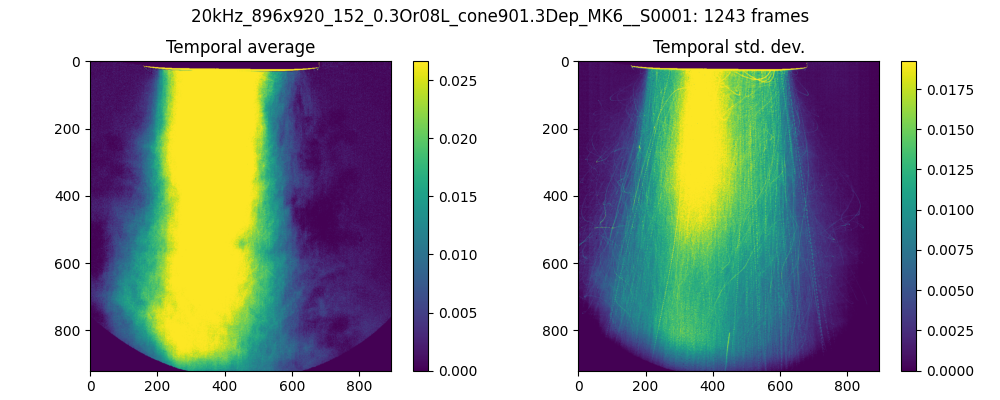

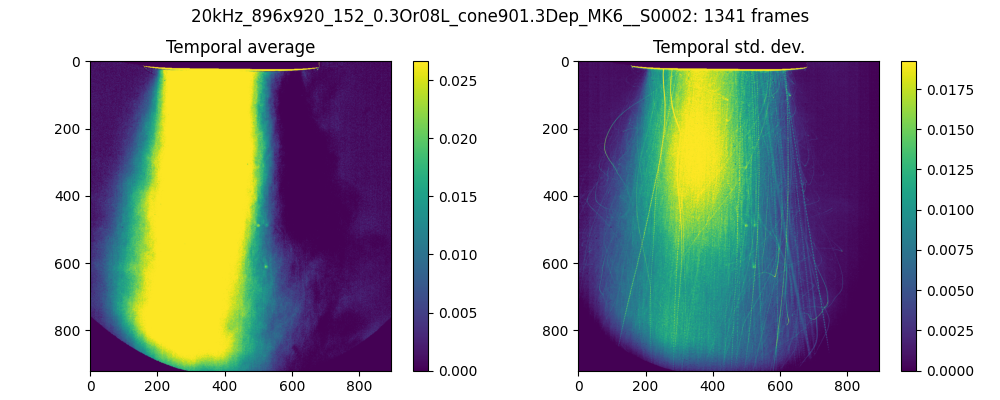

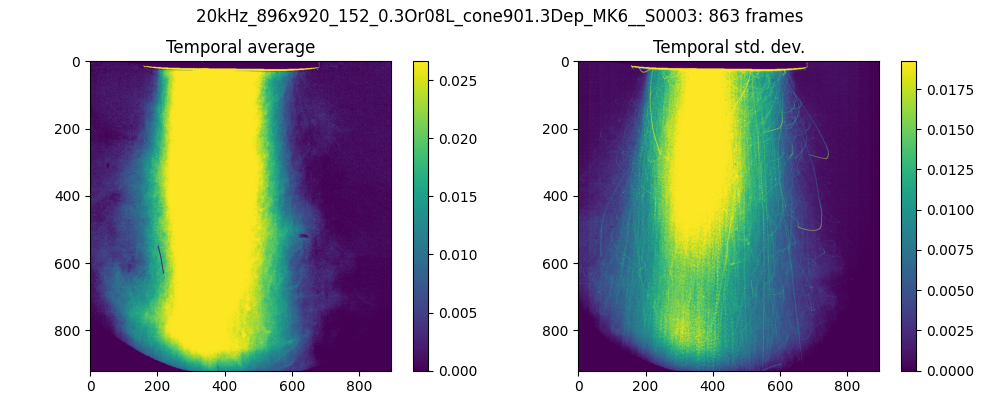

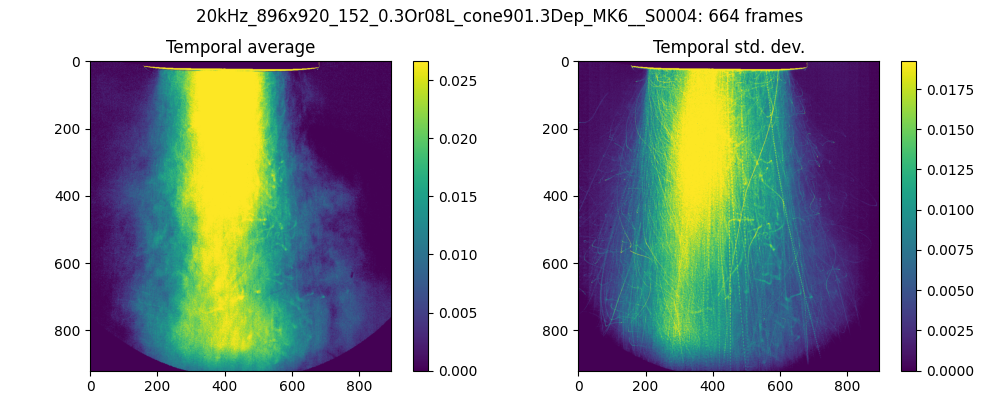

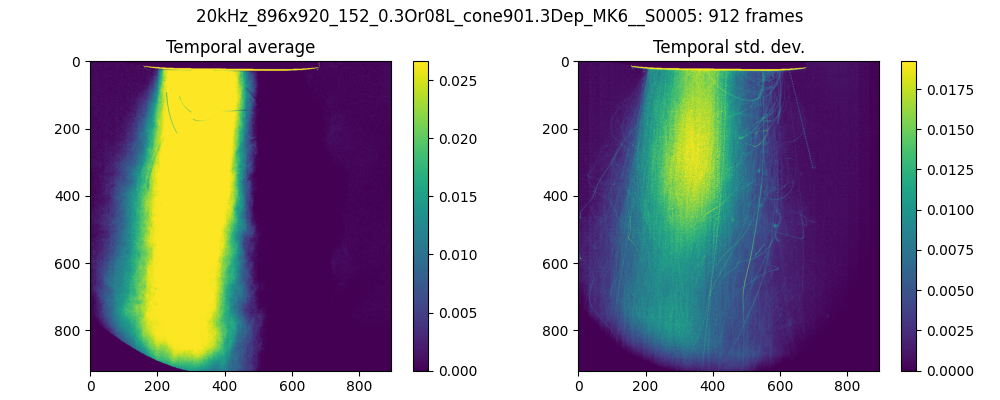

...

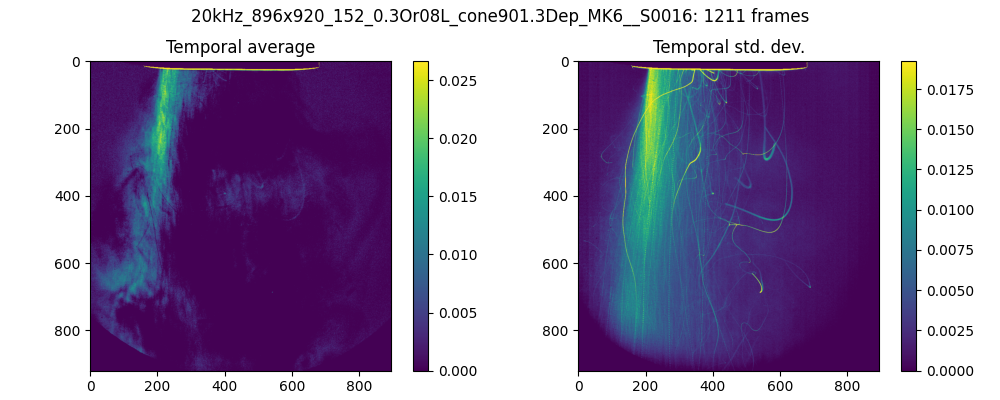

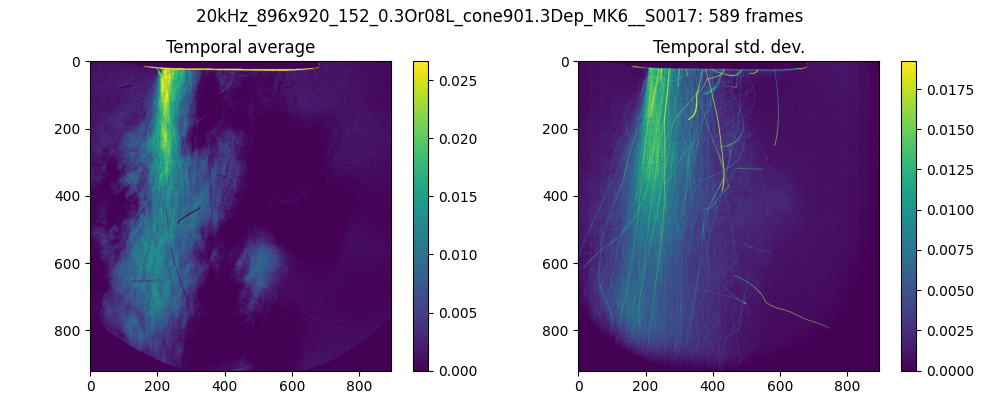

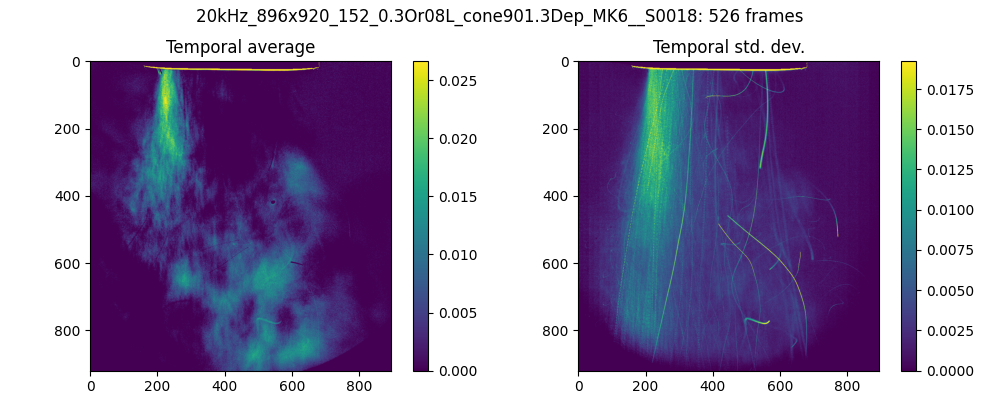

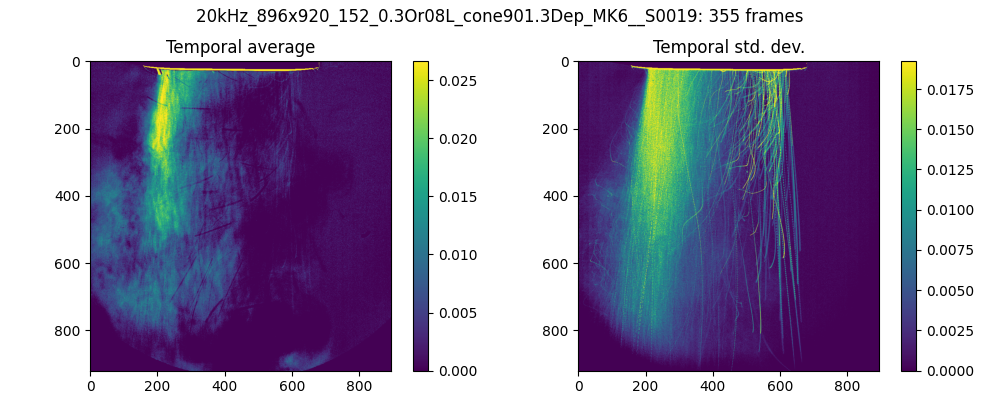

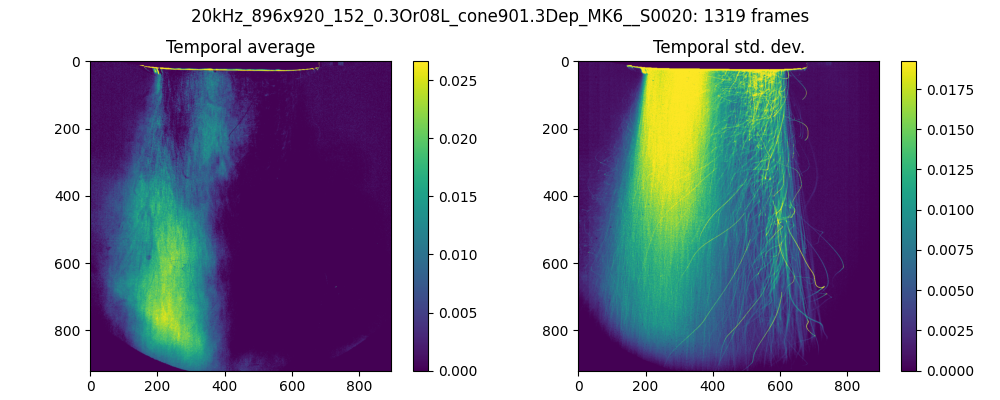

In [23]:
# Plot everything to check it

for k in H.keys():
    if k == 'ensemble statistics': continue
    filteredTemporalAverage = H[k]['temporal mean']
    filteredTemporalStd = H[k]['temporal std dev']
    #print(H[k]['spray_morphology'].attrs.keys());break
    t0 = H[k]['spray_morphology'].attrs['t0']
    t1 = H[k]['spray_morphology'].attrs['t1']
    
    fig=plt.figure(figsize=(10,4))
    ax=fig.add_subplot(121)
    plt.title("Temporal average")
    p=ax.imshow(filteredTemporalAverage,vmin=0,vmax=meanmax) # uniform levels, to match above.
    plt.colorbar(p)
    ax=fig.add_subplot(122)
    plt.title("Temporal std. dev.")
    corner=np.nanmean(filteredTemporalStd[0:10,0:10])
    p=ax.imshow(filteredTemporalStd-corner,vmin=0,vmax=temporalstdmax)
    plt.colorbar(p);
    plt.suptitle('%s: %i frames' % (k,t1-t0))
    plt.tight_layout();

In [10]:
H.close()